# 2.2 Pregled lastnosti molekulskih prstnih odtisov

In [1]:
%run __A_knjiznice.py

# Import specific elements from the script
from __A_knjiznice import *
from __B_funkcije import analyze_fingerprints
from __C_konstante import *

## Pregled raznolikosti posameznih lastnosti

In [2]:
# Define the input directory
input_directory = f'{path_files}/molekulski_prstni_odtisi'

# Call the function and get the results DataFrame
results_df = analyze_fingerprints(input_directory)
results_df = results_df.sort_values(by='Share of Columns with Same Data', ascending=False)
results_df

,Fingerprint,Total Features,Varying Columns,100% same values in column,95% same values in column,Share of Columns with Same Data,Collinear Features Count
13,df_estate.csv,79,29,50,60,0.632911,2
3,df_klekota-roth.csv,4860,1832,3028,4672,0.623045,528
0,df_cdk-atompairs.csv,780,400,380,618,0.487179,121
18,df_cdk-substructure.csv,307,162,145,263,0.472313,31
19,df_lingo.csv,1024,680,344,860,0.335938,202
15,df_topological-torsion.csv,2048,1416,632,1891,0.308594,204
14,df_pubchem.csv,881,646,235,540,0.266742,398
4,df_rdk-maccs.csv,167,156,11,47,0.065868,34
8,df_maccs.csv,166,157,9,50,0.054217,40
5,df_atom-pair.csv,2048,1954,94,1379,0.045898,64


In [3]:
# Assuming results_df is the DataFrame returned from analyze_fingerprints
filtered_fingerprints = results_df[results_df['Share of Columns with Same Data'] < 0.20]['Fingerprint'].tolist()

# Print or return the list of filtered fingerprints
print(filtered_fingerprints)

['df_rdk-maccs.csv', 'df_maccs.csv', 'df_atom-pair.csv', 'df_extended.csv', 'df_graph.csv', 'df_shortestpath.csv', 'df_fp2.csv', 'df_standard.csv', 'df_hybridization.csv', 'df_rdkit.csv', 'df_circular.csv', 'df_avalon.csv', 'df_morgan.csv']


## Dvodimenzionalen pregled razporeditve lastnosti sm pomocjo metode analize glavnih kompomnent (ang. Principal Component Analysis. PCA)

## Analiza Scree test (Scree plot)

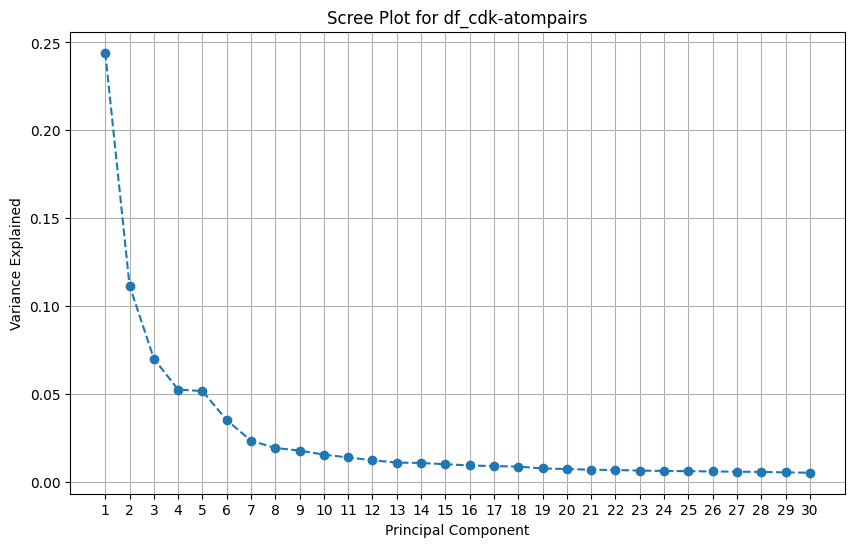

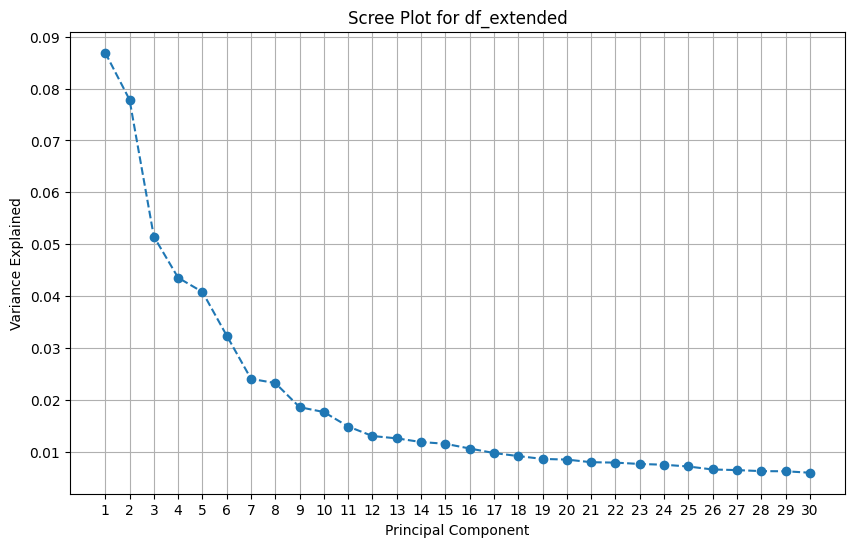

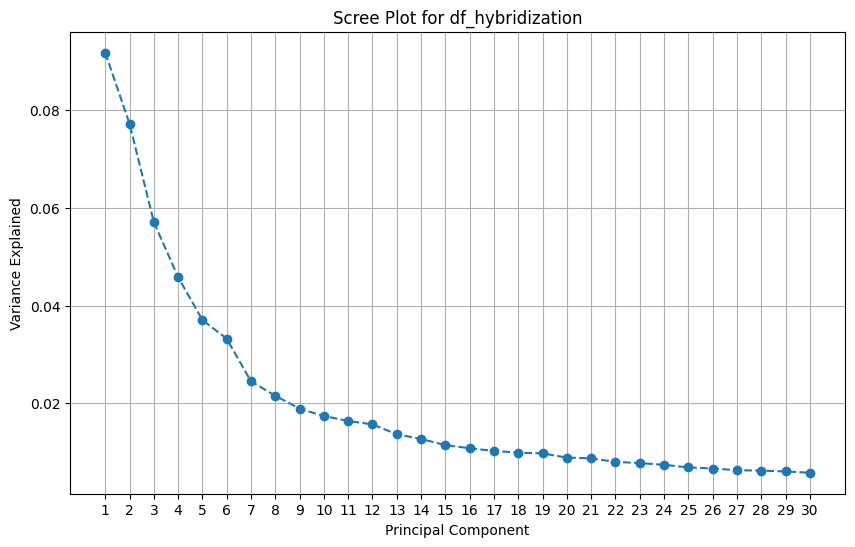

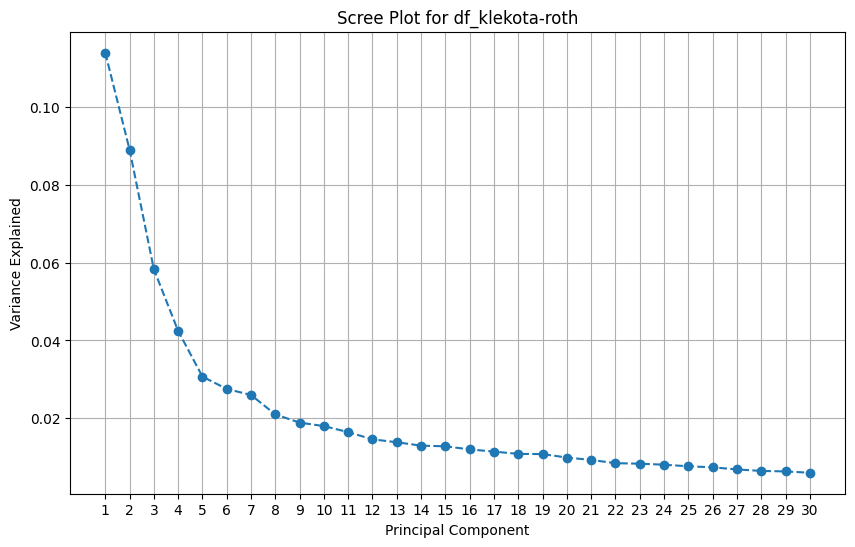

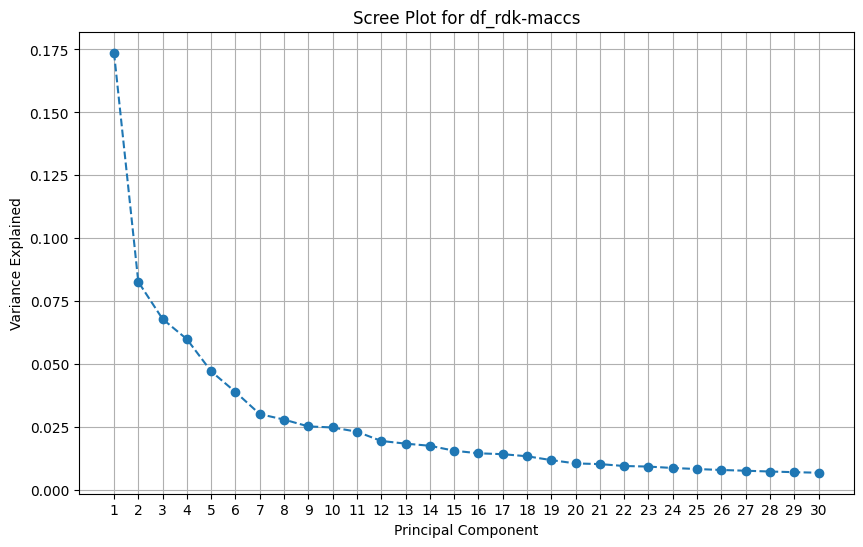

...

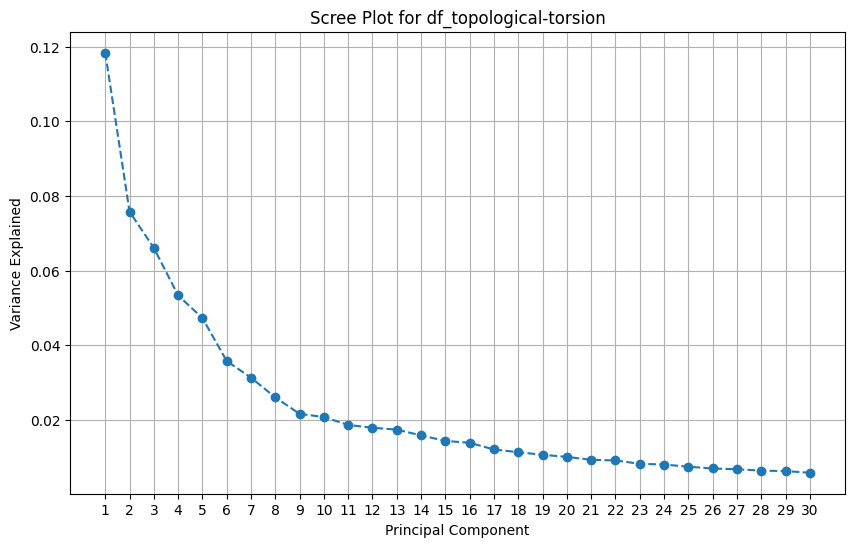

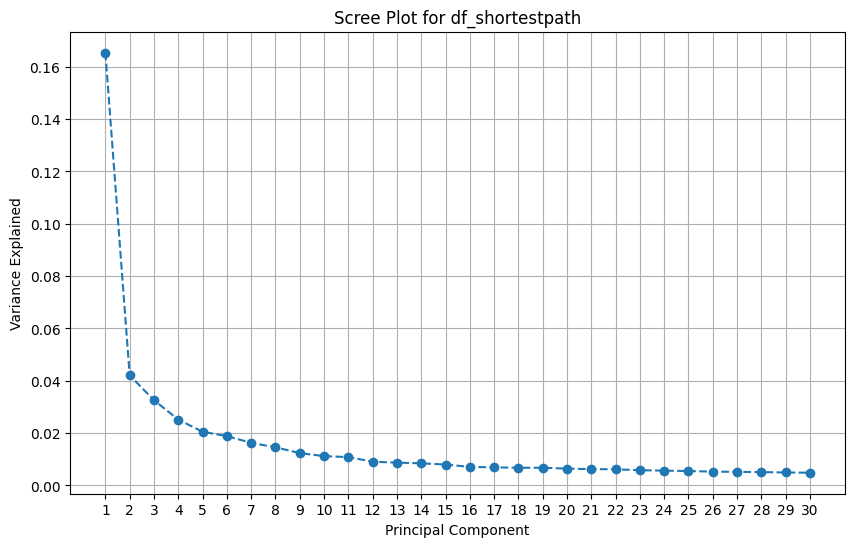

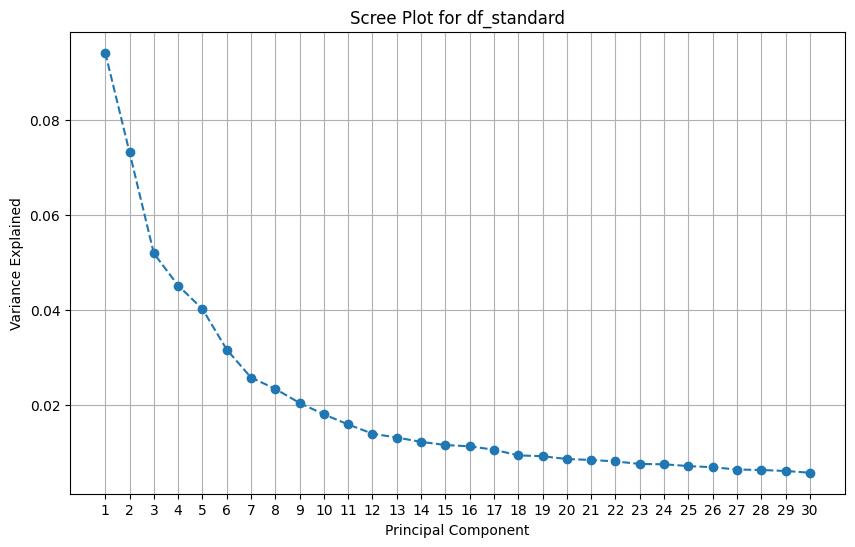

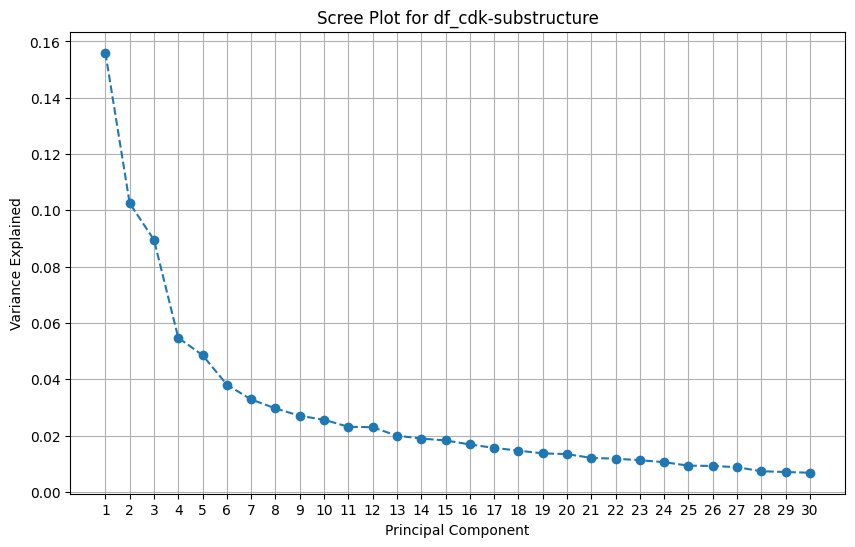

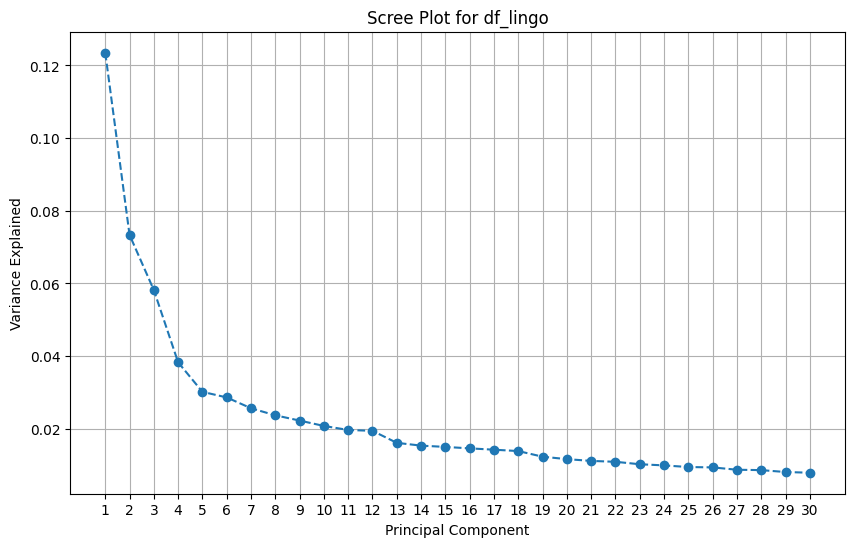

In [4]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming input_directory is defined
for filename in os.listdir(input_directory):
    if filename.endswith('.csv'):  # Adjust this if your files are in a different format
        # Load the data
        df = pd.read_csv(os.path.join(input_directory, filename))
        
        # Skip the first three columns if necessary
        df_to_analyze = df.iloc[:, 3:]

        # Apply PCA
        pca = PCA()  # Fit PCA without specifying n_components to get all components
        pca.fit(df_to_analyze)

        # Get the explained variance (eigenvalues)
        explained_variance = pca.explained_variance_ratio_

        # Create a scree plot for the first 30 components
        num_components_to_plot = min(30, len(explained_variance))  # Limit to 30 or fewer components
        plt.figure(figsize=(10, 6))
        plt.plot(range(1, num_components_to_plot + 1), explained_variance[:num_components_to_plot], marker='o', linestyle='--')
        plt.title(f'Scree Plot for {filename[:-4]}')  # Remove the .csv extension for the title
        plt.xlabel('Principal Component')
        plt.ylabel('Variance Explained')
        plt.xticks(range(1, num_components_to_plot + 1))
        plt.grid()
        plt.show()

## Razpršeni diagram dvodimenzijske prezentacije prstnih odtisov molekul, ki bodo uporabljene za treniranje modela SU

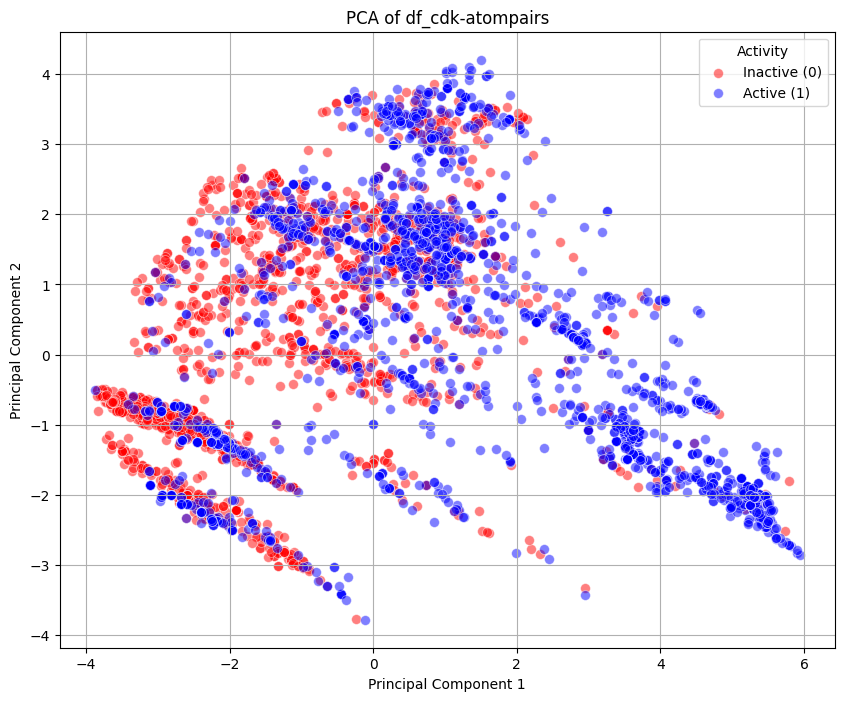

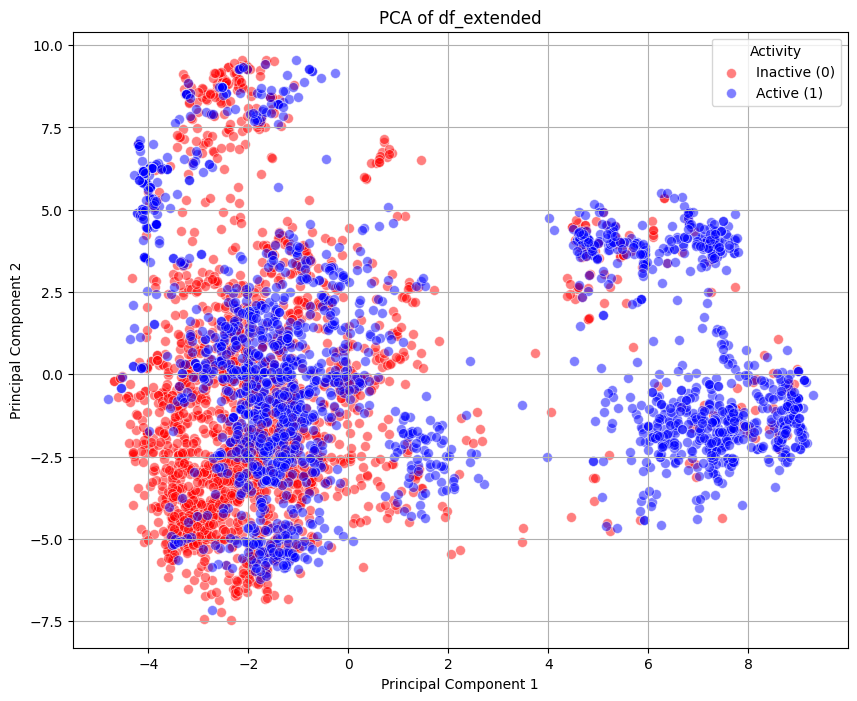

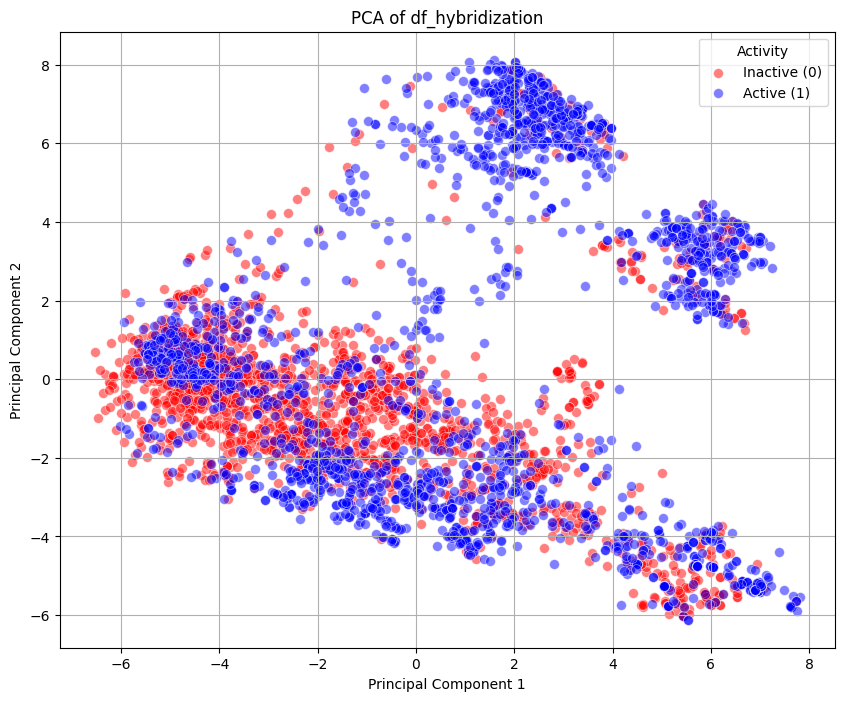

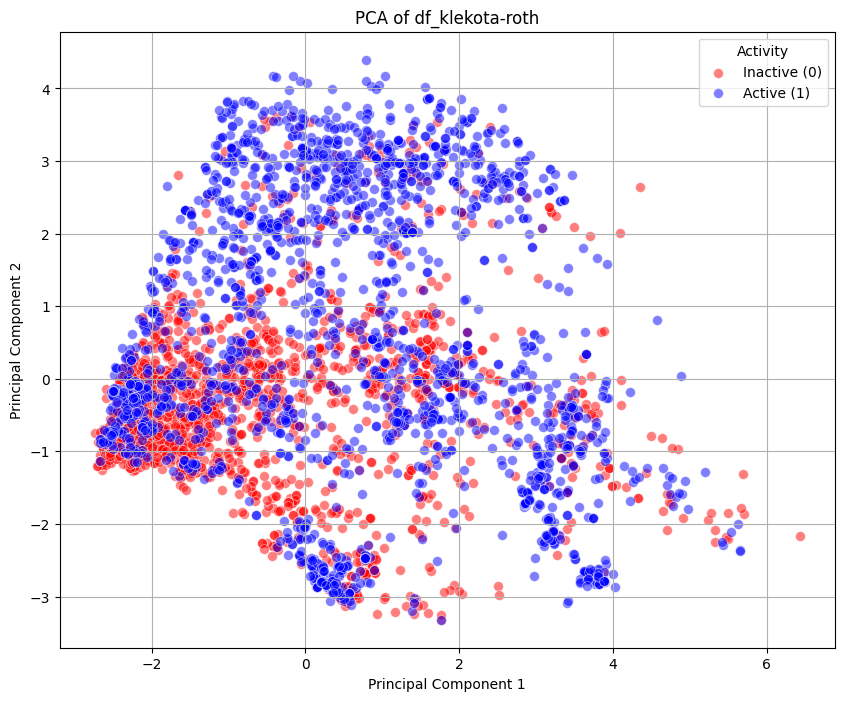

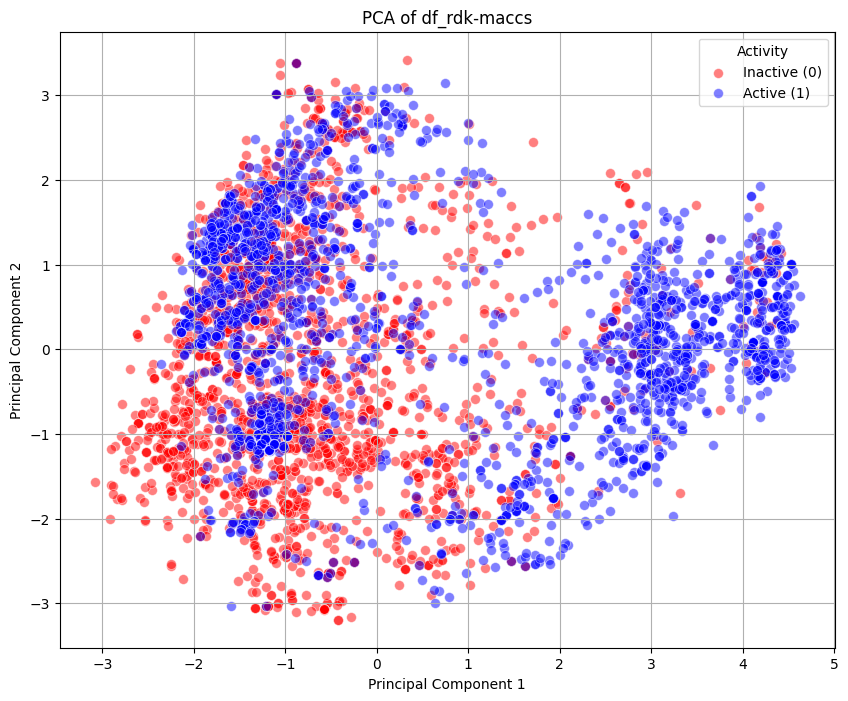

...

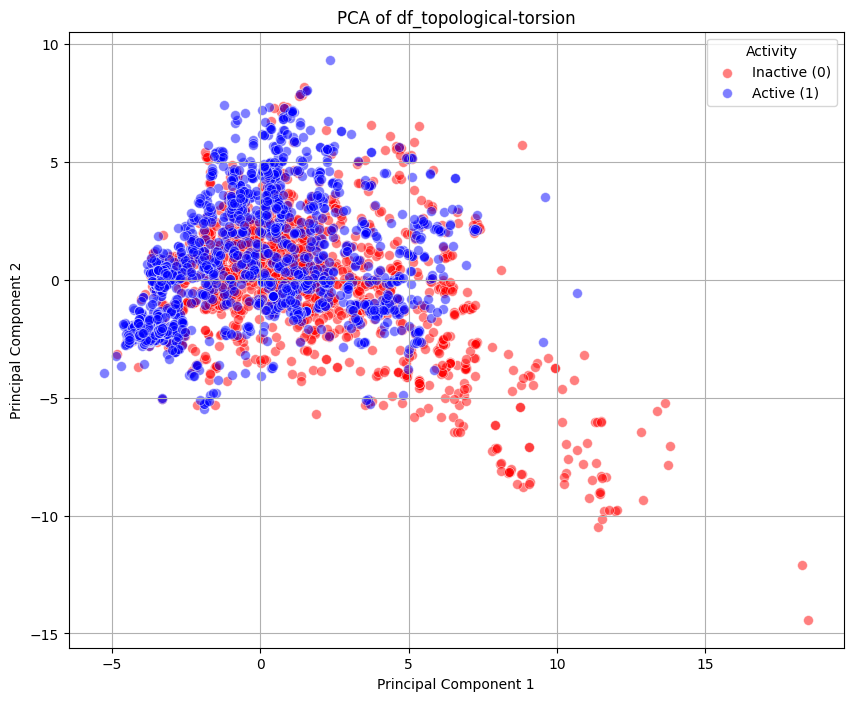

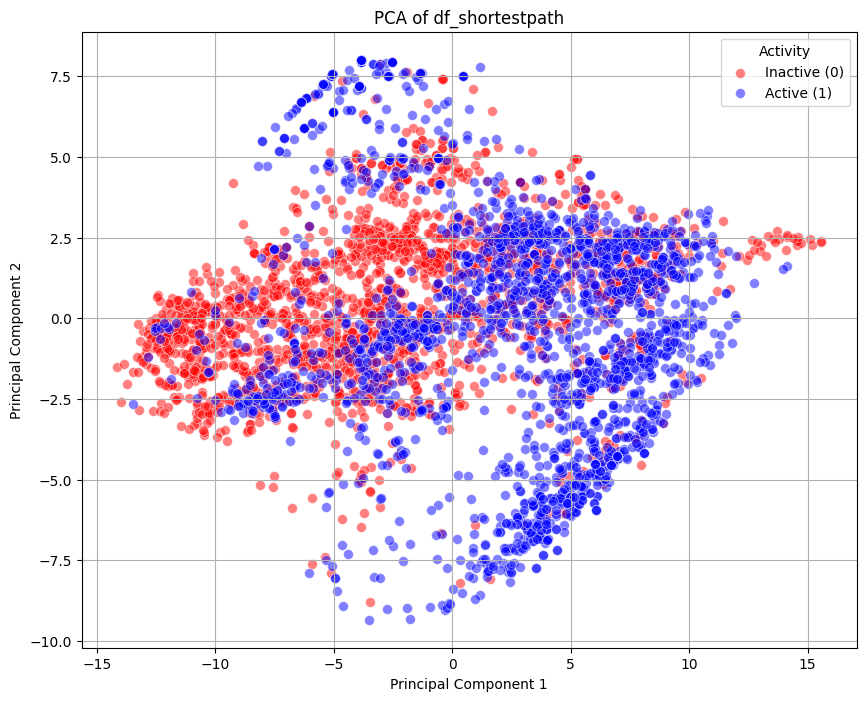

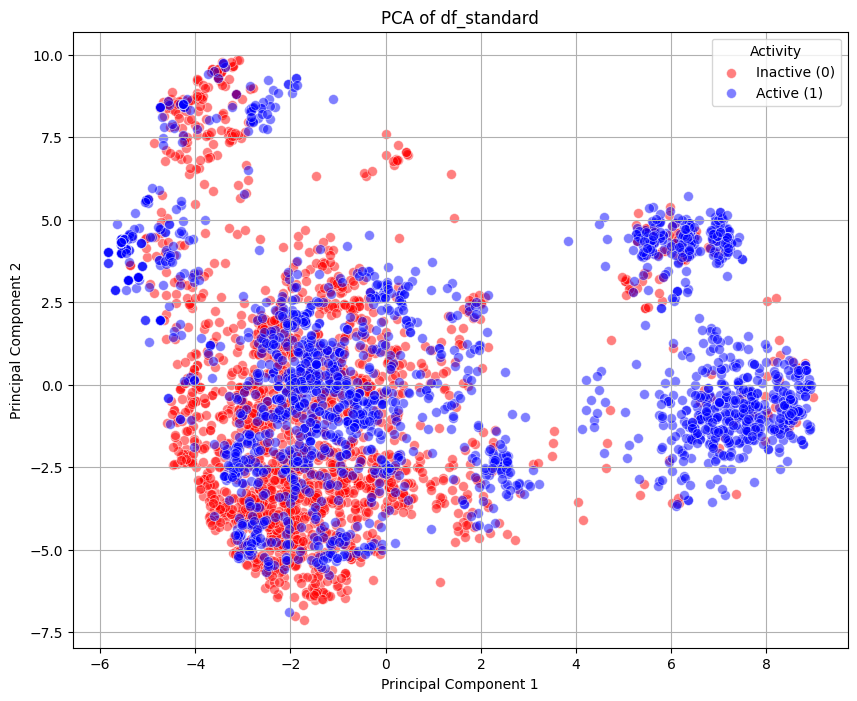

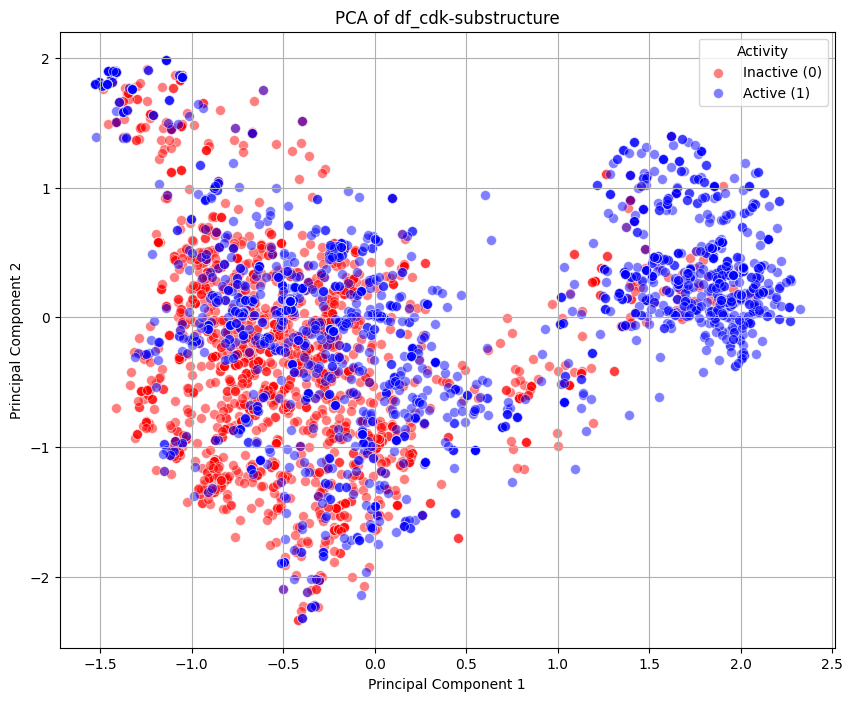

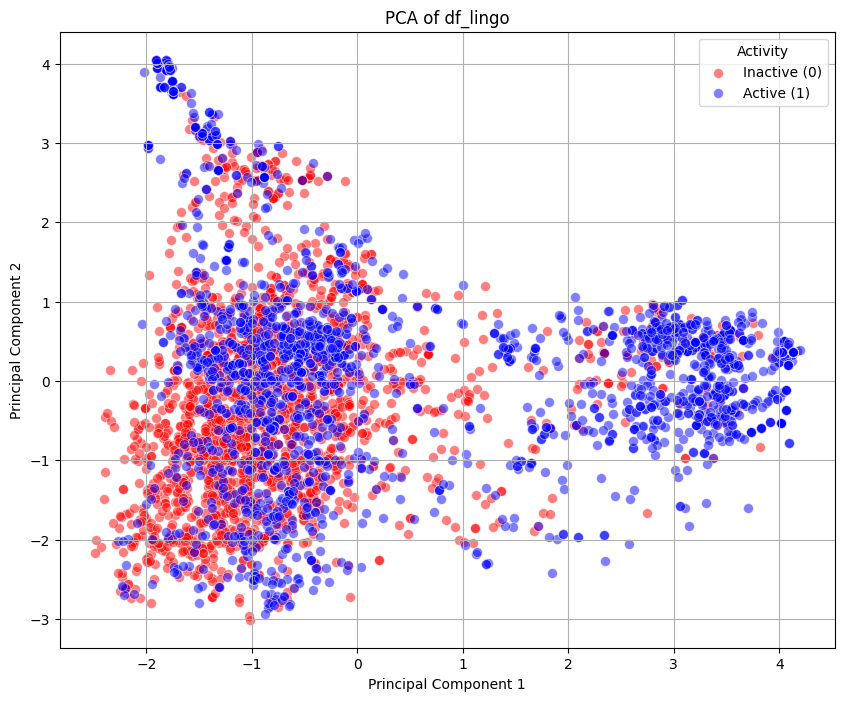

In [5]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Assuming input_directory is defined
for filename in os.listdir(input_directory):
    if filename.endswith('.csv'):  # Adjust this if your files are in a different format
        # Load the data
        df = pd.read_csv(os.path.join(input_directory, filename))
        
        # Skip the first three columns if necessary
        df_to_analyze = df.iloc[:, 3:]

        # Extract the 'Activity' column for color mapping
        activity = df['Activity']  # Make sure 'Activity' is the correct column name

        # Apply PCA
        pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
        principal_components = pca.fit_transform(df_to_analyze)

        # Create a DataFrame with the principal components and the Activity column
        pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])
        pca_df['Activity'] = activity  # Add the Activity column to the PCA DataFrame

        # Plot the PCA results with color mapping
        plt.figure(figsize=(10, 8))
        
        # Plot inactive molecules with transparency
        sns.scatterplot(x='PC1', y='PC2', data=pca_df[pca_df['Activity'] == 0], 
                        color='red', alpha=0.5, label='Inactive (0)', s=50)  # Adjust size as needed
        
        # Plot active molecules with transparency
        sns.scatterplot(x='PC1', y='PC2', data=pca_df[pca_df['Activity'] == 1], 
                        color='blue', alpha=0.5, label='Active (1)', s=50)  # Adjust size as needed
        
        plt.title(f'PCA of {filename[:-4]}')  # Remove the .csv extension for the title
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.grid()
        plt.legend(title='Activity')
        plt.show()


# Deepchem analiza

No normalization for SPS. Feature removed!
No normalization for AvgIpc. Feature removed!


Instructions for updating:
experimental_relax_shapes is deprecated, use reduce_retracing instead


Skipped loading modules with pytorch-geometric dependency, missing a dependency. No module named 'torch_geometric'
Skipped loading modules with transformers dependency. No module named 'transformers'
cannot import name 'HuggingFaceModel' from 'deepchem.models.torch_models' (/Users/samonose/PycharmProjects/IDO_inhibitors_ML_predictions/.venv/lib/python3.10/site-packages/deepchem/models/torch_models/__init__.py)
Skipped loading modules with pytorch-geometric dependency, missing a dependency. cannot import name 'DMPNN' from 'deepchem.models.torch_models' (/Users/samonose/PycharmProjects/IDO_inhibitors_ML_predictions/.venv/lib/python3.10/site-packages/deepchem/models/torch_models/__init__.py)
Skipped loading modules with pytorch-lightning dependency, missing a dependency. No module named 'lightning'
Skipped loading some Jax models, missing a dependency. No module named 'jax'


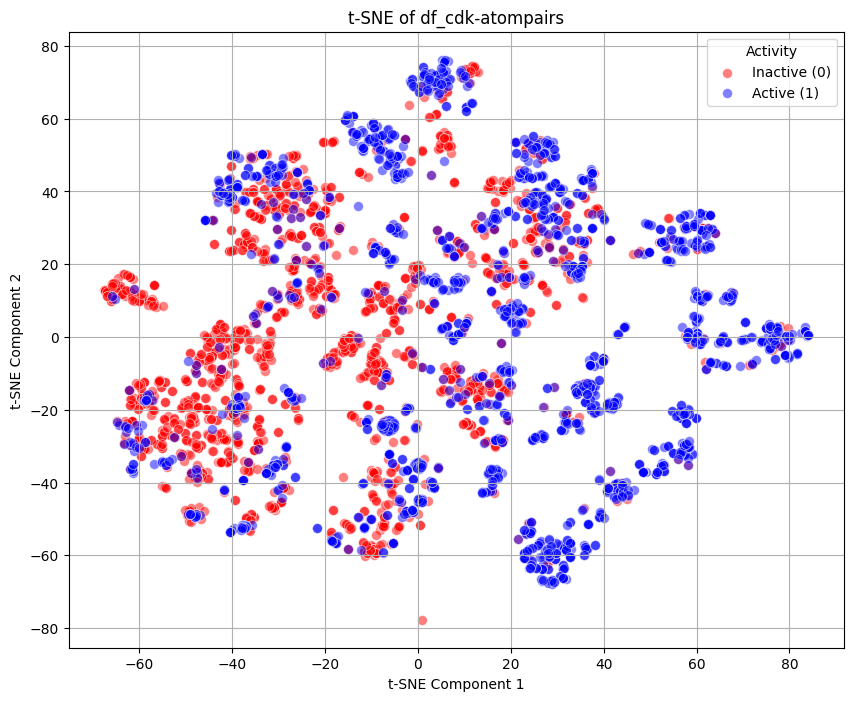

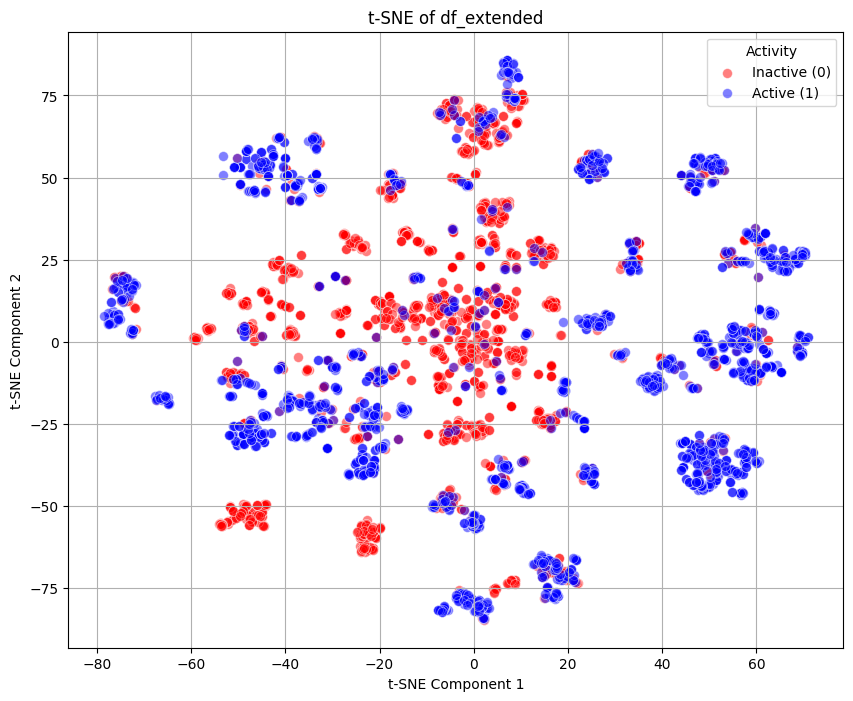

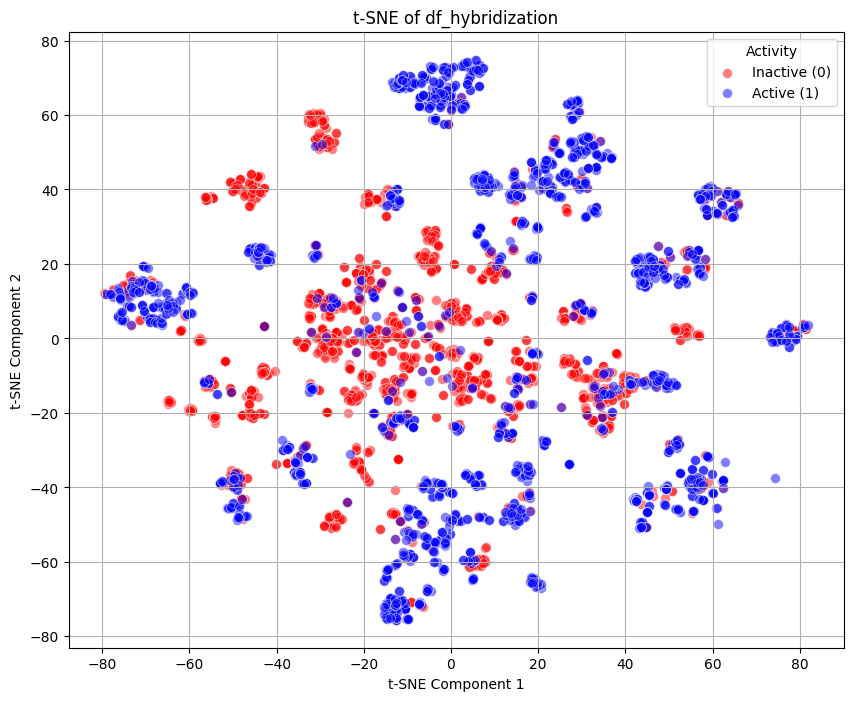

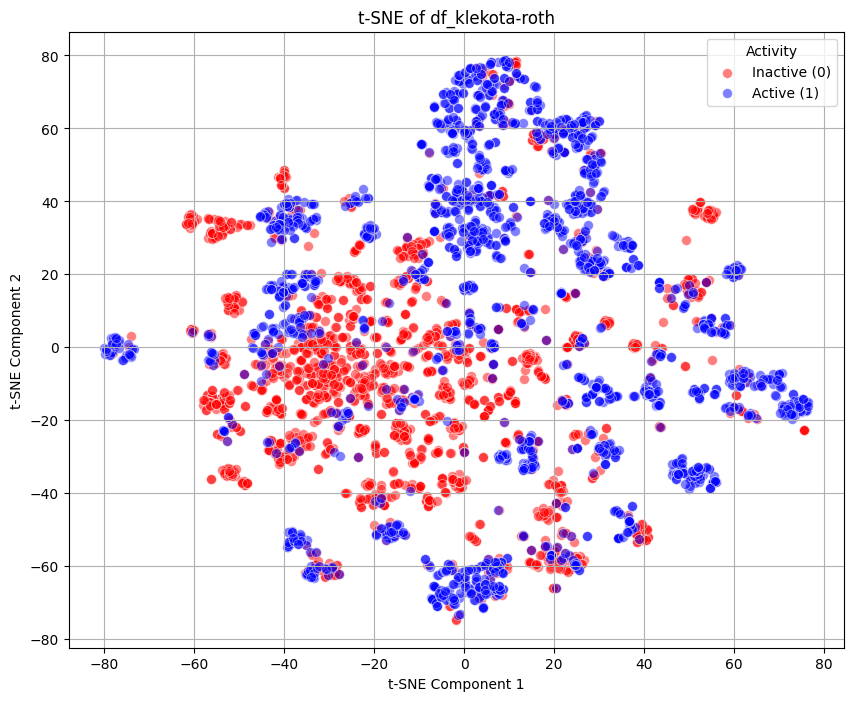

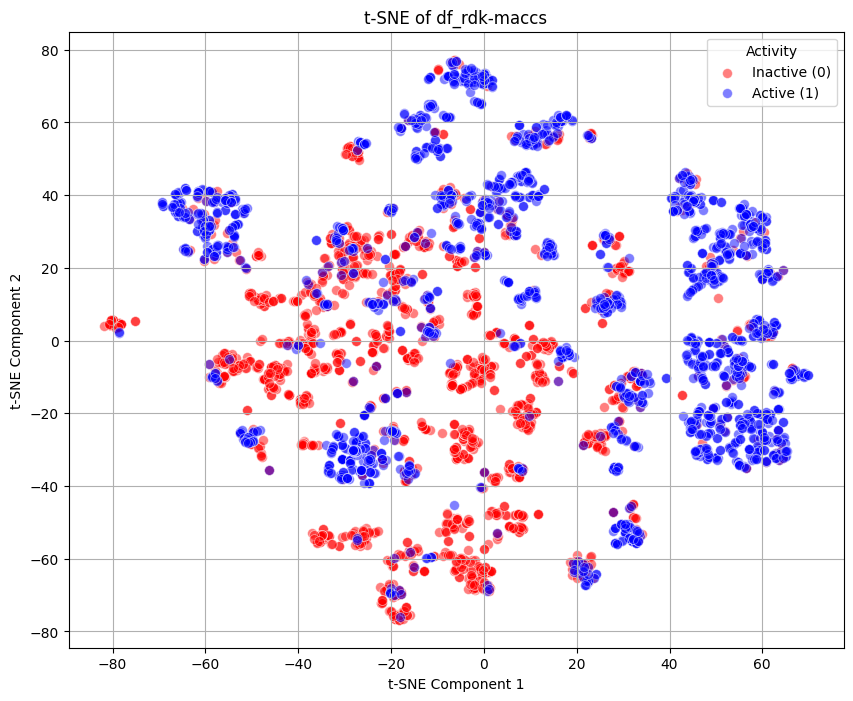

...

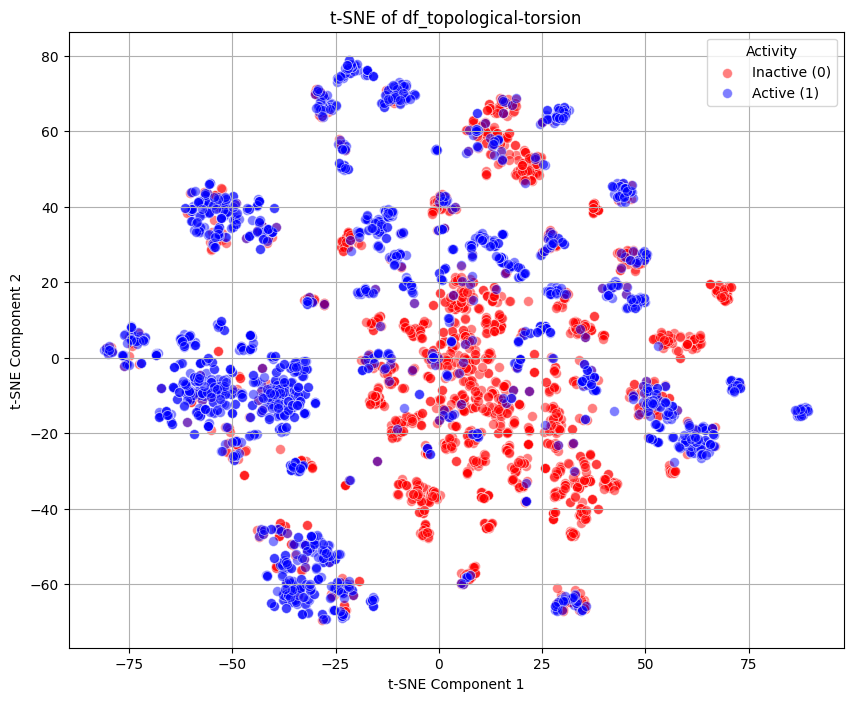

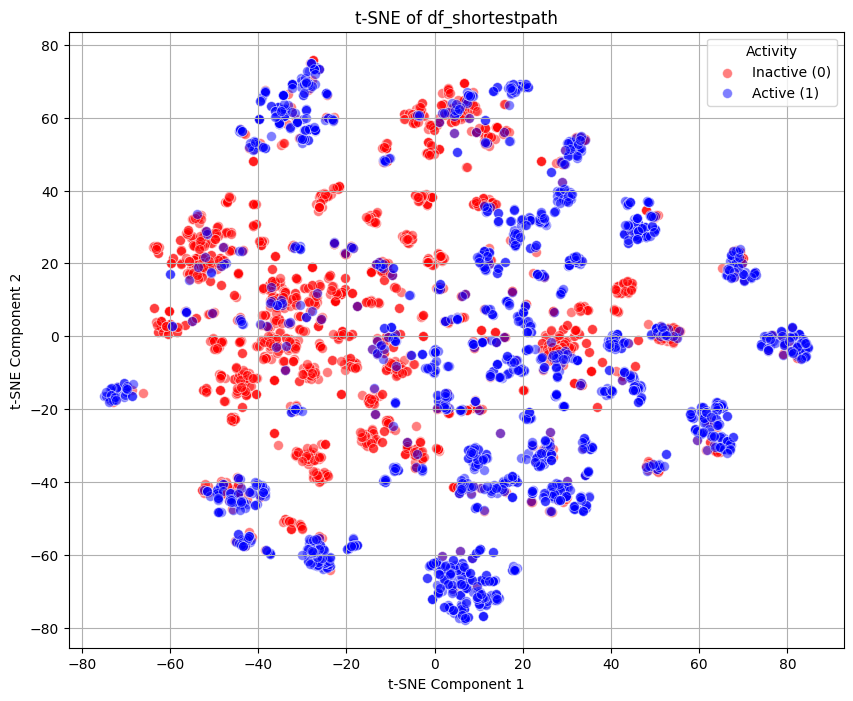

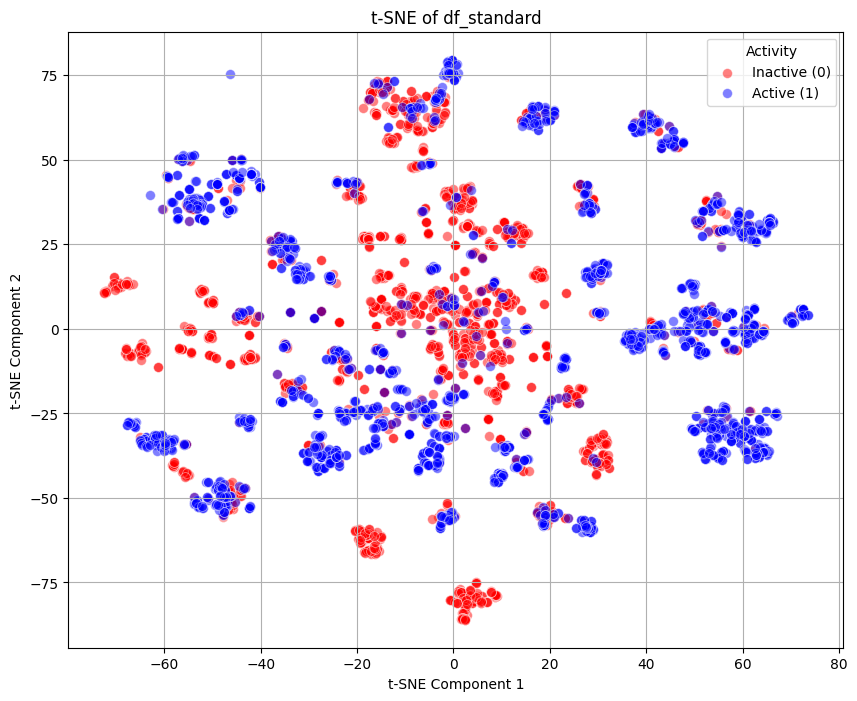

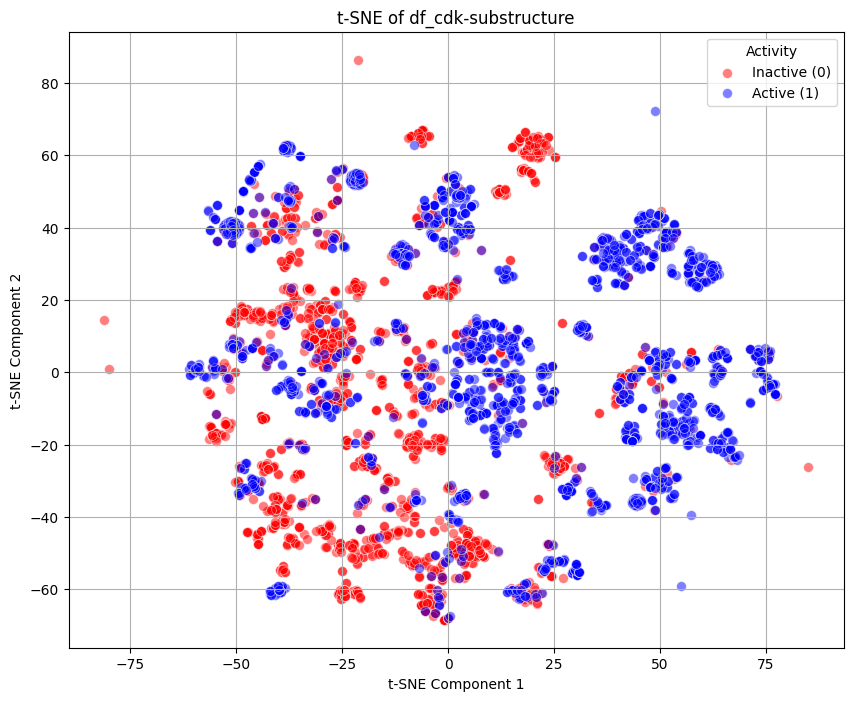

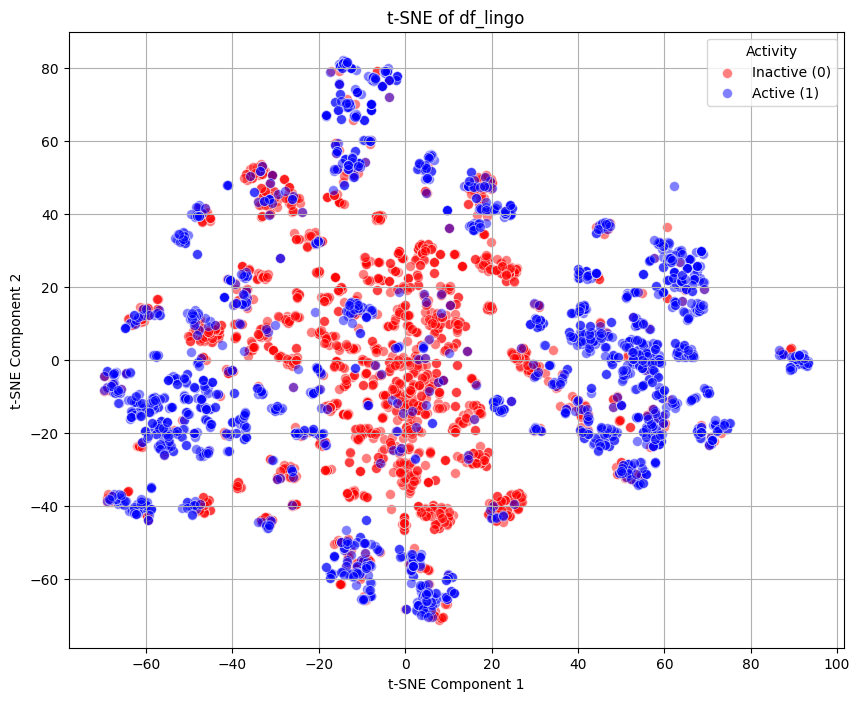

In [7]:
from sklearn.manifold import TSNE
import deepchem as dc

# Assuming input_directory is defined
for filename in os.listdir(input_directory):
    if filename.endswith('.csv'):  # Adjust this if your files are in a different format
        # Load the data
        df = pd.read_csv(os.path.join(input_directory, filename))
        
        # Skip the first three columns if necessary
        df_to_analyze = df.iloc[:, 3:]

        # Extract the 'Activity' column for color mapping
        activity = df['Activity']  # Make sure 'Activity' is the correct column name

        # Apply t-SNE
        tsne = TSNE(n_components=2, random_state=42)  # Reduce to 2 dimensions for visualization
        tsne_results = tsne.fit_transform(df_to_analyze)

        # Create a DataFrame with the t-SNE results and the Activity column
        tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2'])
        tsne_df['Activity'] = activity  # Add the Activity column to the t-SNE DataFrame

        # Plot the t-SNE results with color mapping
        plt.figure(figsize=(10, 8))
        
        # Plot inactive molecules with transparency
        sns.scatterplot(x='TSNE1', y='TSNE2', data=tsne_df[tsne_df['Activity'] == 0], 
                        color='red', alpha=0.5, label='Inactive (0)', s=50)  # Adjust size as needed
        
        # Plot active molecules with transparency
        sns.scatterplot(x='TSNE1', y='TSNE2', data=tsne_df[tsne_df['Activity'] == 1], 
                        color='blue', alpha=0.5, label='Active (1)', s=50)  # Adjust size as needed
        
        plt.title(f't-SNE of {filename[:-4]}')  # Remove the .csv extension for the title
        plt.xlabel('t-SNE Component 1')
        plt.ylabel('t-SNE Component 2')
        plt.grid()
        plt.legend(title='Activity')
        plt.show()


In [8]:
# Assuming you have the DataFrame already
filename = 'df_circular.csv'
file_path = os.path.join(input_directory, filename)  # Full path to the file
df_1 = pd.read_csv(file_path)

# Count the number of times each fingerprint feature is set to 1 across the entire dataset
# Skip the first two columns (Smiles and Activity)
feature_counts = df_1.iloc[:, 3:].sum(axis=0)

# Sort the counts in descending order to find the most common features
sorted_feature_counts = feature_counts.sort_values(ascending=False)

# Create a DataFrame for better visualization
feature_counts_df = pd.DataFrame(sorted_feature_counts).reset_index()
feature_counts_df.columns = ['Feature', 'Count']

# Display the resulting DataFrame
feature_counts_df


,Feature,Count
0,Bit_133,4140.0
1,Bit_967,4130.0
2,Bit_549,3751.0
3,Bit_404,3209.0
4,Bit_514,2637.0
...,...,...
1019,Bit_519,24.0
1020,Bit_307,24.0
1021,Bit_98,23.0
1022,Bit_78,22.0


In [9]:
df = df_1.copy()

# Split the DataFrame into active and inactive based on the 'Activity' column
active_df = df[df['Activity'] == 1]  # Assuming 1 indicates active
inactive_df = df[df['Activity'] == 0]  # Assuming 0 indicates inactive

# Count the number of times each fingerprint feature is set to 1 for active compounds
active_bit_counts = active_df.iloc[:, 3:].sum(axis=0)  # Skip the first two columns (Smiles and Activity)
active_bit_counts = active_bit_counts.sort_values(ascending=False)

# Count the number of times each fingerprint feature is set to 1 for inactive compounds
inactive_bit_counts = inactive_df.iloc[:, 3:].sum(axis=0)  # Skip the first two columns
inactive_bit_counts = inactive_bit_counts.sort_values(ascending=False)

# Create DataFrames to hold the counts
active_counts_df = pd.DataFrame(active_bit_counts).reset_index()
active_counts_df.columns = ['Feature', 'Active_Count']

inactive_counts_df = pd.DataFrame(inactive_bit_counts).reset_index()
inactive_counts_df.columns = ['Feature', 'Inactive_Count']

# Merge the two DataFrames on the feature column
merged_counts_df = pd.merge(active_counts_df, inactive_counts_df, on='Feature', how='outer')

sorted_merged_counts_df = merged_counts_df.sort_values(by='Active_Count', ascending=False)
sorted_merged_counts_df

,Feature,Active_Count,Inactive_Count
63,Bit_133,2102.0,2038.0
988,Bit_967,2101.0,2029.0
524,Bit_549,1899.0,1852.0
364,Bit_404,1872.0,1337.0
487,Bit_515,1692.0,900.0
...,...,...,...
780,Bit_78,7.0,15.0
355,Bit_397,7.0,59.0
443,Bit_476,6.0,24.0
256,Bit_307,5.0,19.0


## Pregled lastnosti, ki najbolj pogosto razlikujejo aktivne od neaktivnih molekul

In [10]:
merged_counts_df['Difference'] = merged_counts_df['Active_Count'] - merged_counts_df['Inactive_Count']

# Sort the DataFrame by the Difference column in descending order
sorted_df = merged_counts_df.sort_values(by='Difference', ascending=False)
sorted_df

,Feature,Active_Count,Inactive_Count,Difference
292,Bit_34,1474.0,629.0,845.0
487,Bit_515,1692.0,900.0,792.0
432,Bit_466,1445.0,682.0,763.0
65,Bit_135,1003.0,336.0,667.0
502,Bit_529,1158.0,497.0,661.0
...,...,...,...,...
216,Bit_271,244.0,528.0,-284.0
640,Bit_653,443.0,789.0,-346.0
969,Bit_95,518.0,924.0,-406.0
649,Bit_661,250.0,679.0,-429.0
